In [14]:
from ucimlrepo import fetch_ucirepo
from implementations import bayes
from implementations import id3
from implementations import random_forest
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
from typing import Tuple
import pandas as pd
import time
import importlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
import random
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt

In [15]:
X = np.loadtxt("../data_processed/diabetes/X.csv", delimiter=",")
y = np.loadtxt("../data_processed/diabetes/y.csv", delimiter=",")

[3.86921186e-07 3.01709013e-08] 1.0
[6.37197431e-08 5.67123313e-11] 0.0
[7.21766053e-12 2.62562971e-09] 0.0
[1.27820939e-06 5.70002290e-07] 0.0
[4.45943585e-07 7.02904485e-08] 1.0
[1.37817435e-06 1.08456565e-06] 1.0
[1.14153780e-08 2.67859042e-08] 0.0
[3.01916068e-10 3.29024202e-10] 1.0
[3.34650580e-07 5.60094841e-07] 0.0
[3.07035561e-08 5.15493176e-09] 1.0
[1.59511122e-08 1.91919535e-08] 1.0
[2.70102907e-07 5.28531568e-08] 1.0
[1.78594479e-06 1.41193813e-08] 0.0
[2.55938017e-09 1.71619484e-07] 1.0
[7.24782489e-11 1.10482331e-09] 1.0
[1.25650261e-11 4.06386405e-10] 1.0
[4.40084996e-12 3.86438756e-10] 1.0
[1.97682253e-13 4.36472698e-10] 1.0
[5.49104423e-09 1.67527934e-07] 1.0
[1.46860071e-08 1.92473554e-08] 1.0
[1.23990642e-06 9.58827196e-09] 0.0
[3.65326616e-08 1.71421315e-08] 0.0
[2.66907319e-05 5.62454195e-08] 0.0
[3.23047482e-06 1.59669336e-06] 0.0
[2.75753101e-13 5.46287703e-10] 1.0
[1.66635355e-08 8.84037801e-08] 1.0
[2.42062445e-13 1.34211833e-10] 1.0
[3.44640584e-09 4.89834753e-

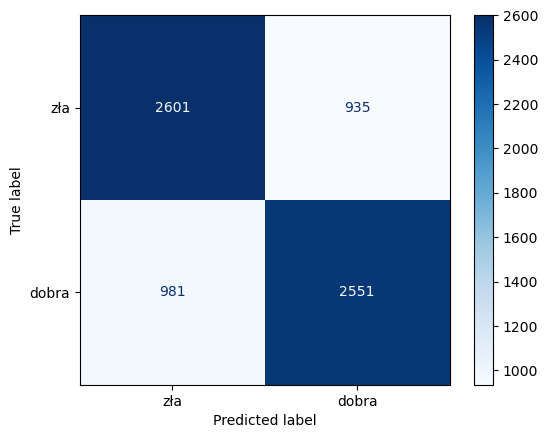

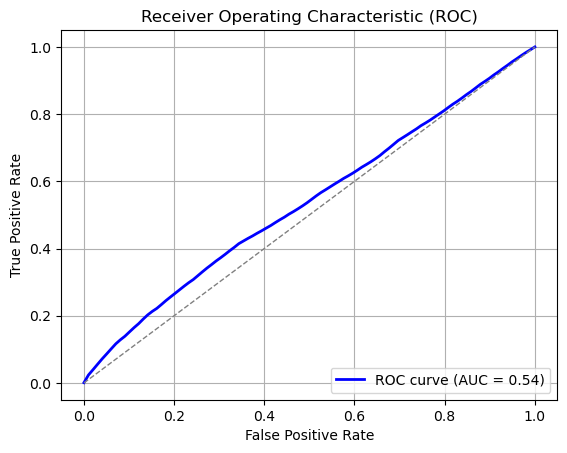

In [16]:
#################### BAYES
importlib.reload(random_forest)
accuracies = []
time1 = time.time()

fpr_list = []
tpr_list = []
auc_list = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    bay = bayes.NaiveBayes()
    bay.fit(x_train, y_train)

    samples = len(y_test)
    correctly_predicted = 0
    scores = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = bay.predict(sample)
        scores.append(prediction[1]) #############333
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1

    fpr, tpr, _ = roc_curve(y_test, scores)
    roc_auc = auc(fpr, tpr)
    # y_pred = np.array(y_pred)

    fpr_list.append(fpr)
    tpr_list.append(tpr)
    auc_list.append(roc_auc)
    # y_pred = np.array(y_pred)

    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")



cm = confusion_matrix(y_testing, y_pred, labels=[0, 1])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["zła", "dobra"])
disp.plot(cmap=plt.cm.Blues)
plt.show()


# Define a common set of FPR values
mean_fpr = np.linspace(0, 1, 100)

# Interpolate TPR values
tpr_interp = [np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(fpr_list, tpr_list)]

# Average the interpolated TPR values
mean_tpr = np.mean(tpr_interp, axis=0)

# Compute the mean AUC
mean_auc = np.mean(auc_list)


# Plot ROC curve
plt.figure()
plt.plot(mean_fpr, mean_tpr, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

[0. 1.] 1.0
[0. 1.] 1.0
[0. 1.] 0.0
[1. 0.] 0.0
[1. 0.] 0.0
[1. 0.] 0.0
[0. 1.] 1.0
[0. 1.] 1.0
[1. 0.] 0.0
[0. 1.] 1.0
[1. 0.] 0.0
[0. 1.] 1.0
[1. 0.] 0.0
[0. 1.] 1.0
[1. 0.] 0.0
[0. 1.] 0.0
[1. 0.] 0.0
[0. 1.] 1.0
[1. 0.] 0.0
[0. 1.] 1.0
[1. 0.] 1.0
[0. 1.] 1.0
[1. 0.] 0.0
[1. 0.] 0.0
[0. 1.] 0.0
[1. 0.] 1.0
[1. 0.] 1.0
[0. 1.] 0.0
[0. 1.] 0.0
[0. 1.] 0.0
[0. 1.] 1.0
[0. 1.] 1.0
[1. 0.] 1.0
[0. 1.] 0.0
[1. 0.] 0.0
[1. 0.] 0.0
[1. 0.] 0.0
[0. 1.] 1.0
[0. 1.] 1.0
[0. 1.] 0.0
[0. 1.] 1.0
[1. 0.] 0.0
[0. 1.] 1.0
[0. 1.] 0.0
[1. 0.] 0.0
[1. 0.] 0.0
[0. 1.] 1.0
[0. 1.] 1.0
[1. 0.] 0.0
[1. 0.] 0.0
[1. 0.] 0.0
[0. 1.] 1.0
[1. 0.] 1.0
[1. 0.] 0.0
[0. 1.] 1.0
[0. 1.] 1.0
[1. 0.] 0.0
[1. 0.] 0.0
[0. 1.] 0.0
[1. 0.] 0.0
[0. 1.] 1.0
[1. 0.] 0.0
[1. 0.] 0.0
[1. 0.] 0.0
[0. 1.] 0.0
[1. 0.] 0.0
[0. 1.] 1.0
[1. 0.] 0.0
[0. 1.] 0.0
[1. 0.] 0.0
[0. 1.] 1.0
[0. 1.] 1.0
[0. 1.] 0.0
[1. 0.] 1.0
[1. 0.] 0.0
[1. 0.] 0.0
[0. 1.] 1.0
[0. 1.] 1.0
[0. 1.] 0.0
[1. 0.] 0.0
[1. 0.] 0.0
[0. 1.] 1.0
[0. 1.] 1.0
[0. 

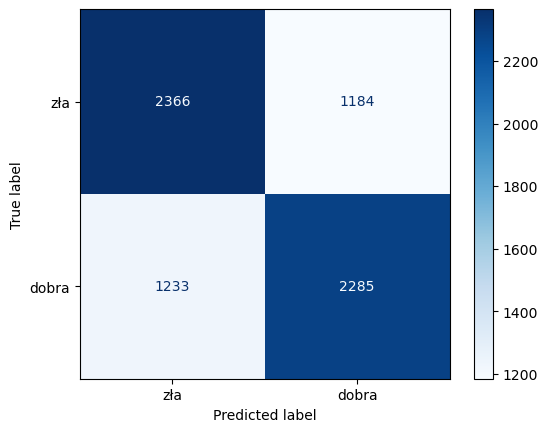

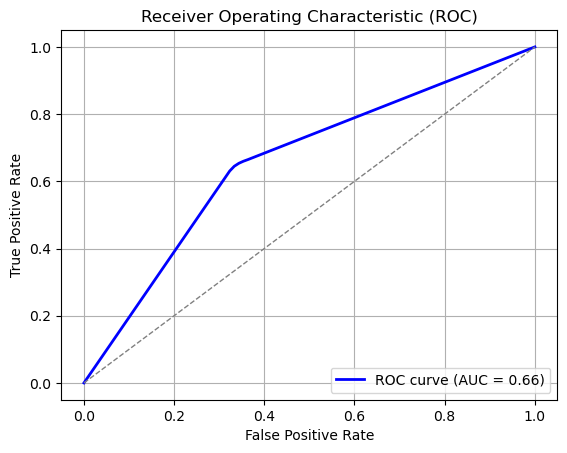

In [21]:
#################### ID3
importlib.reload(random_forest)
accuracies = []
time1 = time.time()


fpr_list = []
tpr_list = []
auc_list = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    tree = id3.DecisionTreeClassifier(1e10)
    tree.fit(x_train, y_train)

    samples = len(y_test)
    correctly_predicted = 0
    scores = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = tree.predict(sample)
        scores.append(prediction[1]) #############333
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1

    fpr, tpr, _ = roc_curve(y_test, scores)
    roc_auc = auc(fpr, tpr)
    # y_pred = np.array(y_pred)

    fpr_list.append(fpr)
    tpr_list.append(tpr)
    auc_list.append(roc_auc)

    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")



cm = confusion_matrix(y_testing, y_pred, labels=[0, 1])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["zła", "dobra"])
disp.plot(cmap=plt.cm.Blues)
plt.show()


# Define a common set of FPR values
mean_fpr = np.linspace(0, 1, 100)

# Interpolate TPR values
tpr_interp = [np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(fpr_list, tpr_list)]

# Average the interpolated TPR values
mean_tpr = np.mean(tpr_interp, axis=0)

# Compute the mean AUC
mean_auc = np.mean(auc_list)


# Plot ROC curve
plt.figure()
plt.plot(mean_fpr, mean_tpr, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

[0.92 0.08] 0.0
[0.1 0.9] 1.0
[0.68 0.32] 1.0
[1. 0.] 0.0
[0.18 0.82] 1.0
[0.84 0.16] 0.0
[0.56 0.44] 0.0
[0.18 0.82] 0.0
[0.36 0.64] 1.0
[0.08 0.92] 1.0
[0.16 0.84] 1.0
[0.32 0.68] 1.0
[0.14 0.86] 1.0
[0.5 0.5] 1.0
[0.98 0.02] 0.0
[0.1 0.9] 0.0
[0.22 0.78] 1.0
[0.12 0.88] 1.0
[0.68 0.32] 0.0
[0.7 0.3] 1.0
[0.96 0.04] 0.0
[0.48 0.52] 0.0
[0.08 0.92] 1.0
[0.38 0.62] 1.0
[0.9 0.1] 0.0
[0.18 0.82] 1.0
[0.42 0.58] 1.0
[0.52 0.48] 1.0
[0.1 0.9] 1.0
[0.18 0.82] 1.0
[0.74 0.26] 0.0
[0.74 0.26] 0.0
[0.54 0.46] 0.0
[0.18 0.82] 1.0
[0.26 0.74] 1.0
[0.44 0.56] 0.0
[0.16 0.84] 1.0
[0.16 0.84] 1.0
[0.7 0.3] 0.0
[0.4 0.6] 0.0
[0.1 0.9] 1.0
[0.02 0.98] 1.0
[0.94 0.06] 1.0
[0.24 0.76] 0.0
[0.9 0.1] 0.0
[0.52 0.48] 0.0
[0.14 0.86] 0.0
[0.96 0.04] 0.0
[0.12 0.88] 1.0
[0.66 0.34] 1.0
[0.16 0.84] 1.0
[1. 0.] 0.0
[0.6 0.4] 1.0
[0.12 0.88] 1.0
[0.74 0.26] 0.0
[0.14 0.86] 1.0
[0.4 0.6] 1.0
[0.84 0.16] 0.0
[0.9 0.1] 0.0
[0.96 0.04] 0.0
[0.42 0.58] 1.0
[0.66 0.34] 1.0
[1. 0.] 0.0
[0.52 0.48] 1.0
[0.16 0.84] 1.

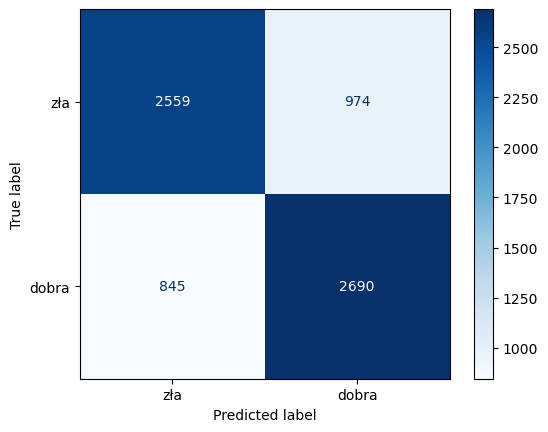

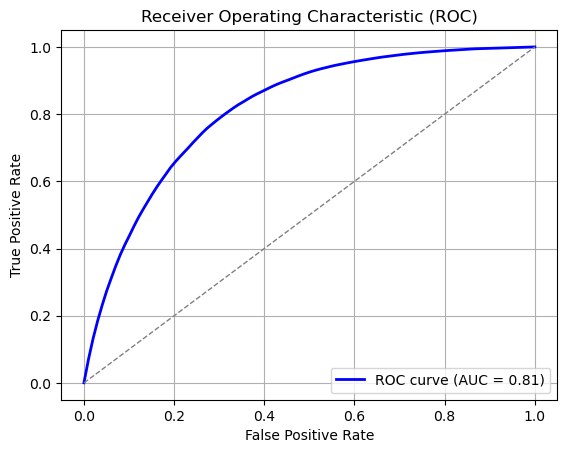

In [23]:
#################### RANDOM FOREST ID3 100%
importlib.reload(random_forest)
accuracies = []
time1 = time.time()

fpr_list = []
tpr_list = []
auc_list = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    rfc = random_forest.RandomForestClassifier(classifiers_number=50)
    rfc.fit(x_train, y_train, tree_percentage=1.0)

    samples = len(y_test)
    correctly_predicted = 0
    scores = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = rfc.predict(sample)
        scores.append(prediction[1]) #############333
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1

    fpr, tpr, _ = roc_curve(y_test, scores)
    roc_auc = auc(fpr, tpr)
    # y_pred = np.array(y_pred)

    fpr_list.append(fpr)
    tpr_list.append(tpr)
    auc_list.append(roc_auc)
    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")



cm = confusion_matrix(y_testing, y_pred, labels=[0, 1])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["zła", "dobra"])
disp.plot(cmap=plt.cm.Blues)
plt.show()



# Define a common set of FPR values
mean_fpr = np.linspace(0, 1, 100)

# Interpolate TPR values
tpr_interp = [np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(fpr_list, tpr_list)]

# Average the interpolated TPR values
mean_tpr = np.mean(tpr_interp, axis=0)

# Compute the mean AUC
mean_auc = np.mean(auc_list)


# Plot ROC curve
plt.figure()
plt.plot(mean_fpr, mean_tpr, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

[0.92 0.08] 1.0
[0.12 0.88] 1.0
[0.04 0.96] 1.0
[0.98 0.02] 0.0
[0.7 0.3] 1.0
[0.14 0.86] 0.0
[0.16 0.84] 1.0
[0.06 0.94] 1.0
[0.06 0.94] 1.0
[0.94 0.06] 0.0
[0.08 0.92] 1.0
[0.96 0.04] 0.0
[0.96 0.04] 0.0
[0.94 0.06] 0.0
[0.88 0.12] 0.0
[0.04 0.96] 1.0
[0.2 0.8] 1.0
[1. 0.] 0.0
[0.7 0.3] 1.0
[0.98 0.02] 1.0
[0.8 0.2] 0.0
[0.2 0.8] 1.0
[0. 1.] 1.0
[0.78 0.22] 0.0
[0.2 0.8] 0.0
[0.98 0.02] 0.0
[0.22 0.78] 1.0
[0.96 0.04] 0.0
[0.62 0.38] 0.0
[0.1 0.9] 1.0
[0.06 0.94] 1.0
[0. 1.] 1.0
[1. 0.] 0.0
[1. 0.] 0.0
[0.12 0.88] 0.0
[0.24 0.76] 1.0
[0.2 0.8] 0.0
[0.18 0.82] 1.0
[0.32 0.68] 1.0
[0.1 0.9] 1.0
[0.98 0.02] 0.0
[0.76 0.24] 0.0
[0.98 0.02] 0.0
[0.22 0.78] 1.0
[0.26 0.74] 0.0
[0.12 0.88] 1.0
[0.1 0.9] 1.0
[0.1 0.9] 1.0
[0.9 0.1] 0.0
[0.88 0.12] 1.0
[0.26 0.74] 0.0
[0.1 0.9] 0.0
[0.88 0.12] 0.0
[0.16 0.84] 0.0
[0.82 0.18] 0.0
[0.1 0.9] 1.0
[0.92 0.08] 0.0
[0.06 0.94] 1.0
[0.24 0.76] 1.0
[0.04 0.96] 1.0
[1. 0.] 1.0
[0.18 0.82] 1.0
[0.98 0.02] 0.0
[0.86 0.14] 1.0
[1. 0.] 0.0
[0.76 0.24] 1.0


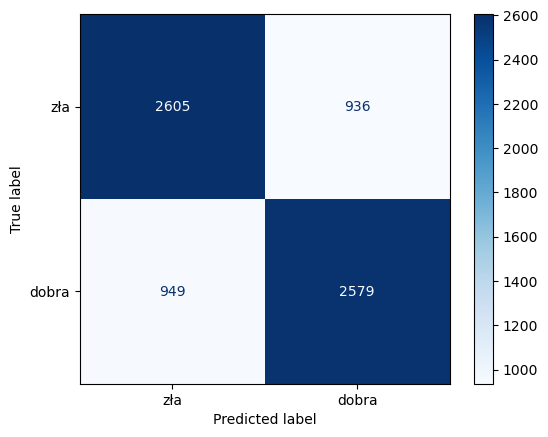

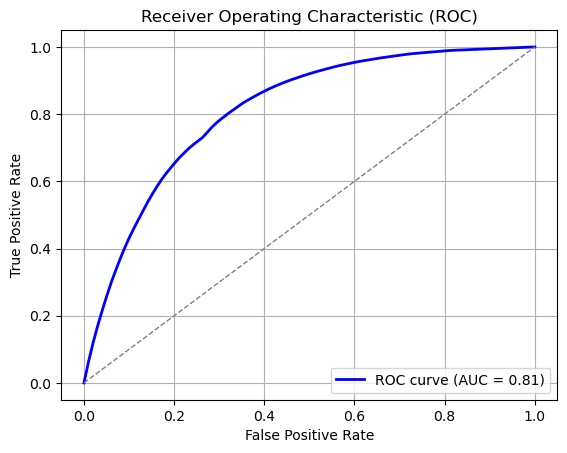

In [24]:
#################### RANDOM FOREST ID3/BAYES 50/50
importlib.reload(random_forest)
accuracies = []
time1 = time.time()

fpr_list = []
tpr_list = []
auc_list = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    rfc = random_forest.RandomForestClassifier(classifiers_number=50)
    rfc.fit(x_train, y_train, tree_percentage=0.5)

    samples = len(y_test)
    correctly_predicted = 0
    scores = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = rfc.predict(sample)
        scores.append(prediction[1]) #############333
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1

    fpr, tpr, _ = roc_curve(y_test, scores)
    roc_auc = auc(fpr, tpr)
    # y_pred = np.array(y_pred)

    fpr_list.append(fpr)
    tpr_list.append(tpr)
    auc_list.append(roc_auc)

    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")



cm = confusion_matrix(y_testing, y_pred, labels=[0, 1])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["zła", "dobra"])
disp.plot(cmap=plt.cm.Blues)
plt.show()


# Define a common set of FPR values
mean_fpr = np.linspace(0, 1, 100)

# Interpolate TPR values
tpr_interp = [np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(fpr_list, tpr_list)]

# Average the interpolated TPR values
mean_tpr = np.mean(tpr_interp, axis=0)

# Compute the mean AUC
mean_auc = np.mean(auc_list)


# Plot ROC curve
plt.figure()
plt.plot(mean_fpr, mean_tpr, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()